In [70]:
import cv2
import numpy as np
import math
import IPython.display as ipd
import matplotlib.pyplot as plt

import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

from scipy.signal import savgol_filter
from scipy.special import expit as sigmoid

In [59]:
ipd.Video("Heronwater - 100 BARS.mp4", width=1000)

In [4]:
ipd.Video("video1996569501.mp4", width=1100)

In [71]:
TARGET_FPS = 5

In [72]:
cap = cv2.VideoCapture("video1996569501.mp4")
model_path = "face_landmarker.task"

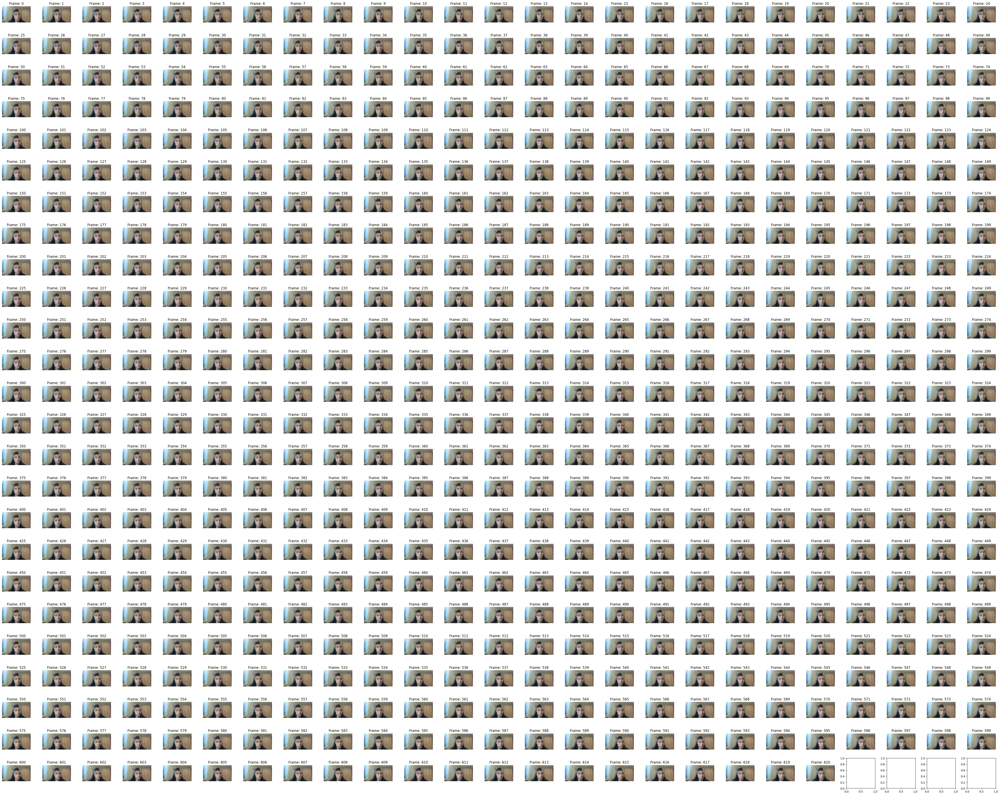

In [ ]:
fps = cap.get(cv2.CAP_PROP_FPS)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
step = max(1, int(math.ceil(fps / TARGET_FPS)))

frame_id = 0

for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break

    if frame_id % step == 0:
        # some logic
        frame_id += 1

cap.release()

In [73]:
BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Create a face landmarker instance with the video mode:
options = FaceLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=model_path),
    running_mode=VisionRunningMode.VIDEO)

fps = cap.get(cv2.CAP_PROP_FPS)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
step = max(1, int(math.ceil(fps / TARGET_FPS)))

with FaceLandmarker.create_from_options(options) as landmarker:
    frame_id = 0
    for frame in range(n_frames):
        ret, img = cap.read()
        if ret == False:
            break

        if frame_id % step == 0:
            img_for_pipe = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=img_for_pipe)
            frame_timestamp_ms = int(frame_id / fps * 1000)
            face_landmarker_result = landmarker.detect_for_video(mp_image, frame_timestamp_ms)
            print(face_landmarker_result)
        frame_id += 1

    cap.release()




I0000 00:00:1764351924.951205  654456 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1764351924.954186  716289 gl_context.cc:369] GL version: 3.2 (OpenGL ES 3.2 Mesa 24.2.8-1ubuntu1~24.04.1), renderer: AMD Radeon Graphics (radeonsi, renoir, LLVM 19.1.1, DRM 3.61, 6.14.0-36-generic)
W0000 00:00:1764351924.954858  654456 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1764351924.958803  716294 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1764351924.976213  716296 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


FaceLandmarkerResult(face_landmarks=[], face_blendshapes=[], facial_transformation_matrixes=[])
FaceLandmarkerResult(face_landmarks=[[NormalizedLandmark(x=0.5627484917640686, y=0.7232964634895325, z=-0.026519840583205223, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5618686079978943, y=0.6621494293212891, z=-0.05880356580018997, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5597186088562012, y=0.679185152053833, z=-0.028533751145005226, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5486827492713928, y=0.5940240025520325, z=-0.0491800531744957, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5616974830627441, y=0.6417906284332275, z=-0.06372823566198349, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5601445436477661, y=0.6138305068016052, z=-0.06080082058906555, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5552884936332703, y=0.5451935529708862, z=-0.035319019109010696, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4719933867454529

In [69]:
BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

# Create a face landmarker instance with the video mode:
options = FaceLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=model_path),
    running_mode=VisionRunningMode.VIDEO)

fps = cap.get(cv2.CAP_PROP_FPS)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
step = max(1, int(math.ceil(fps / TARGET_FPS)))

with FaceLandmarker.create_from_options(options) as landmarker:
    frame_id = 0
    for frame in range(n_frames):
        ret, img = cap.read()
        if ret == False:
            break
        if frame_id % step == 0:
            img_for_pipe = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=img_for_pipe)
            frame_timestamp_ms = int(frame_id / fps * 1000)

            res = landmarker.detect_for_video(mp_image, frame_timestamp_ms)

            print(
                "frame:", frame_id,
                "| faces:", len(res.face_landmarks)
            )

        # if frame_id % step == 0:
        #     img_for_pipe = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #     mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=img_for_pipe)
        #     frame_timestamp_ms = int(frame_id / fps * 1000)
        #     face_landmarker_result = landmarker.detect_for_video(mp_image, frame_timestamp_ms)
        #     print(len(face_landmarker_result.face_landmarks))
        frame_id += 1

    cap.release()




I0000 00:00:1764351886.193044  654456 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1764351886.195140  716112 gl_context.cc:369] GL version: 3.2 (OpenGL ES 3.2 Mesa 24.2.8-1ubuntu1~24.04.1), renderer: AMD Radeon Graphics (radeonsi, renoir, LLVM 19.1.1, DRM 3.61, 6.14.0-36-generic)
W0000 00:00:1764351886.195420  654456 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1764351886.208450  716120 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1764351886.227075  716119 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
